In [3]:
%load_ext autoreload
%autoreload 2

import os
import numpy as np
import pandas as pd
import utils.behavioral_utils as behavioral_utils
import utils.information_utils as information_utils
import utils.visualization_utils as visualization_utils
import utils.glm_utils as glm_utils
from matplotlib import pyplot as plt
import utils.spike_utils as spike_utils
from constants.glm_constants import *
from constants.behavioral_constants import *
from spike_tools import (
    general as spike_general,
    analysis as spike_analysis,
)
from scipy import stats
import warnings
from scipy.ndimage import gaussian_filter1d
import seaborn as sns

warnings.filterwarnings('ignore')

In [4]:
OUTPUT_DIR = "/data/patrick_res/glm_2"
SESSIONS_PATH = "/data/patrick_res/sessions/valid_sessions_rpe.pickle"
sessions = pd.read_pickle(SESSIONS_PATH)

In [5]:
model = "Linear"
mode = "FiringRate"
alpha = 0.05

def get_agg_glm_res(session):
    # res_name = f"{session}_glm_{fb_type}_residual_fr_{MODE}_{INTERVAL_SIZE}_{MODEL}_values.pickle"
    res_name = f"{session}_glm_{EVENT}_{mode}_{INTERVAL_SIZE}_{model}_values_agg.pickle"
    res = pd.read_pickle(os.path.join(OUTPUT_DIR, res_name))
    res["session"] = session
    res["PseudoUnitID"] = int(session) * 100 + res.UnitID

    shuffle_name = f"{session}_glm_{EVENT}_{mode}_{INTERVAL_SIZE}_{model}_values_agg_shuffles.pickle"
    shuffles = pd.read_pickle(os.path.join(OUTPUT_DIR, shuffle_name))
    # sig_bounds = shuffles.groupby("split_idx").apply(lambda group: glm_utils.calculate_sig_stats(group, alpha, 1, "score")).reset_index()
    sig_bounds = glm_utils.calculate_sig_stats(shuffles, alpha, 1, "score")

    merged = pd.merge(res, sig_bounds, on=["UnitID"])
    return merged
glm_res = pd.concat(sessions.apply(lambda x: get_agg_glm_res(x.session_name), axis=1).values)

In [6]:
sig_units = glm_res[glm_res.score > glm_res.sig_bound]

In [7]:
positions = spike_utils.get_unit_positions(sessions)

In [8]:
merged = pd.merge(glm_res, positions, on=["PseudoUnitID", "session", "UnitID"])


In [9]:
good_units = merged[merged.score > 0.1].groupby("structure_level2").PseudoUnitID.nunique().reset_index()
total = merged.groupby("structure_level2").PseudoUnitID.nunique().reset_index()

In [10]:
num_units_merge = pd.merge(good_units, total, on="structure_level2", how="outer").fillna(0)
num_units_merge["ratio"] = num_units_merge["PseudoUnitID_x"] / num_units_merge["PseudoUnitID_y"]

In [11]:
num_units_merge.fillna(0)

,structure_level2,PseudoUnitID_x,PseudoUnitID_y,ratio
0,amygdala (Amy),4.0,42,0.095238
1,anterior_cingulate_gyrus (ACgG),8.0,47,0.170213
2,basal_ganglia (BG),14.0,48,0.291667
3,floor_of_the_lateral_sulcus (floor_of_ls),1.0,3,0.333333
4,inferior_parietal_lobule (IPL),4.0,29,0.137931
5,inferior_temporal_cortex (ITC),21.0,158,0.132911
6,lateral_and_ventral_pallium (LVPal),9.0,53,0.169811
7,lateral_prefrontal_cortex (lat_PFC),24.0,189,0.126984
8,medial_pallium (MPal),3.0,19,0.157895
9,motor_cortex (motor),2.0,50,0.040000


In [12]:
merged[merged.score > 0.1].groupby("session").PseudoUnitID.nunique()

session
20180705         5
20180709         8
20180712        10
201807250001     4
20180801         5
20180802         4
20180803         4
20180806         3
20180808         4
20180910         4
20180912         3
20180917         2
20180918         4
20180920         1
20180921         2
20180924         1
20180925         3
20180926         4
20180928         2
20181001         4
20181002         5
20181003         6
20181004         5
20181005         2
20181008         1
20181009         3
20181010         3
Name: PseudoUnitID, dtype: int64

In [11]:
merged.sort_values(by="score", ascending=False)

,UnitID,TimeBins_x,score,CIRCLEValue_coef,SQUAREValue_coef,STARValue_coef,TRIANGLEValue_coef,CYANValue_coef,GREENValue_coef,MAGENTAValue_coef,...,in_brain,tissue,structure_level1,structure_level2,structure_level3,structure_level4,structure_level5,structure_level6,structure_potential,manual_structure
406,14,0,0.363919,-7.637208,-7.484656,-7.332483,-6.325315,-6.253381,-6.726817,-5.798900,...,True,Cortical_gray_matter,Temporal_Lobe (Temporal),inferior_temporal_cortex (ITC),area_TE (TE),gyral_aspect_of_area_TE (gyral_TE),posterior_area_TE (post_TE),posterior_ventral_area_TE (TEpv),Hippocampal,Hippocampus/MTL
562,15,0,0.334095,-3.701849,-4.440867,-4.411188,-2.956267,-4.862268,-5.512186,-5.854618,...,True,Cortical_gray_matter,Temporal_Lobe (Temporal),inferior_temporal_cortex (ITC),area_TE (TE),gyral_aspect_of_area_TE (gyral_TE),posterior_area_TE (post_TE),posterior_ventral_area_TE (TEpv),Hippocampal,Hippocampus/MTL
656,2,0,0.332779,11.947600,9.012865,8.324141,8.915303,2.372651,5.421509,6.334474,...,True,Subcortical_gray_matter,telencephalon (tel),basal_ganglia (BG),striatum (Str),dorsal_striatum (DStr),caudate (Cd),caudate_head (CdH),[],Basal Ganglia
50,6,0,0.326715,-1.148981,-0.936464,-1.410908,-0.704606,-1.420055,-1.562242,-1.294994,...,True,Cortical_gray_matter,Temporal_Lobe (Temporal),inferior_temporal_cortex (ITC),area_TE (TE),area_TE_in_the_ventral_STS (TE_in_STSv),area_TE_in_the_ventral_STS (TE_in_STSv),area_TEa (TEa),[],Hippocampus/MTL
537,8,0,0.318764,11.849331,11.783408,8.598288,19.877285,4.601323,5.334375,2.742065,...,True,Subcortical_gray_matter,telencephalon (tel),basal_ganglia (BG),striatum (Str),dorsal_striatum (DStr),caudate (Cd),caudate_tail (CdT),[],Basal Ganglia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
649,38,0,0.005815,-0.074624,-0.015822,-0.068944,-0.128270,-0.061175,-0.026348,-0.052684,...,True,Cortical_gray_matter,Temporal_Lobe (Temporal),inferior_temporal_cortex (ITC),fundus_of_the_superior_temporal_sulcus (STSf),fundus_of_the_superior_temporal_sulcus (STSf),anterior_fundus_of_the_superior_temporal_sulcu...,area_IPa (IPa),[],Hippocampus/MTL
331,6,0,0.005134,-0.749961,-0.352094,-0.019193,-0.359513,-1.499436,-0.593132,-0.597681,...,True,Subcortical_gray_matter,telencephalon (tel),lateral_and_ventral_pallium (LVPal),lateral_pallium (LPal),claustrum (Cl),claustrum (Cl),claustrum (Cl),[],Claustrum
340,15,0,0.004602,0.121493,0.336505,0.190703,0.155261,-0.191605,-0.045216,-0.219656,...,True,Cortical_gray_matter,Parietal_Lobe (Parietal),superior_parietal_lobule (SPL),area_5 (area_5),area_5 (area_5),area_PEa (PEa),area_PEa (PEa),[],Parietal Cortex
222,26,0,0.004358,-0.001792,0.000406,0.006593,-0.001000,0.001233,0.009006,-0.000658,...,True,Subcortical_gray_matter,diencephalon (di),thalamus (Thal),geniculate_thalamus (GThal),dorsal_lateral_geniculate (DLG),dorsal_lateral_geniculate (DLG),dorsal_lateral_geniculate (DLG),Hippocampal,unknown


In [1]:
SMOOTH = 1
num_bins = 10
mode = "FiringRate"

def visualize_correlations(row, interesting_feats=[], by_dims=False):
    session = row.session

    behavior_path = SESS_BEHAVIOR_PATH.format(sess_name=session)
    beh = pd.read_csv(behavior_path)

    # filter trials 
    valid_beh = behavioral_utils.get_valid_trials(beh)
    feature_selections = behavioral_utils.get_selection_features(valid_beh)
    valid_beh = pd.merge(valid_beh, feature_selections, on="TrialNumber", how="inner")
    beh = behavioral_utils.get_feature_values_per_session(session, valid_beh)
    beh = behavioral_utils.get_relative_block_position(beh, num_bins)
    beh = behavioral_utils.get_max_feature_value(beh, num_bins, quantize_bins=True)
    beh = behavioral_utils.calc_feature_probs(beh)
    beh = behavioral_utils.calc_feature_value_entropy(beh, num_bins, quantize_bins=True)

    fr_path = f"/data/patrick_res/firing_rates/{session}_firing_rates_{PRE_INTERVAL}_{EVENT}_{POST_INTERVAL}_{INTERVAL_SIZE}_bins_{SMOOTH}_smooth.pickle"

    frs = pd.read_pickle(fr_path)
    frs = frs[frs.UnitID == row.UnitID]
    agg = frs.groupby(["UnitID", "TrialNumber"]).mean().reset_index()
    merged = pd.merge(agg, beh, on="TrialNumber")
    merged = spike_utils.zscore_frs(merged, group_cols=["UnitID", "BlockNumber"], mode="FiringRate")

    fig, axs = plt.subplots(2, 3, figsize=(15, 10))

    ax = axs[0, 0]
    visualization_utils.plot_mean_sterrs_by_bin(merged, mode, "MaxValueBin", ax=ax, label=row.PseudoUnitID, num_bins=num_bins)
    # for dim in POSSIBLE_FEATURES:
    #     features = POSSIBLE_FEATURES[dim]
    #     sub_merged = merged[merged.CurrentRule.isin(features)]
    #     visualization_utils.plot_mean_sterrs_by_bin(sub_merged, mode, "MaxValueBin", ax, label=dim, num_bins=num_bins)
    for feat in interesting_feats:
        sub_merged = merged[merged.CurrentRule == feat]
        visualization_utils.plot_mean_sterrs_by_bin(sub_merged, mode, "MaxValueBin", ax, label=feat, num_bins=num_bins)
    ax.legend()
    ax.set_xlabel("Max Value Bin")
    ax.set_ylabel("Mean firing in inter-trial")
    ax.set_title(f"{row.structure_level2}: {row.PseudoUnitID}")

    # ax = axs[0, 1]
    # mean_sub = spike_utils.mean_sub_frs(merged, group_cols=["UnitID", "BlockNumber"], mode=mode)
    # filt = mean_sub[mean_sub.MaxValue > 0.3]
    # # visualization_utils.plot_bars_by_cat(filt, f"MeanSub{mode}", "MaxFeat", ax, order=FEATURES)
    # visualization_utils.plot_bars_by_cat(filt, mode, "MaxFeat", ax, order=FEATURES)
    # # visualization_utils.plot_mean_sterrs_by_block_pos(beh, "MaxValue", ax, row.PseudoUnitID, num_block_bins)
    # ax.set_ylabel("Mean firing in inter-trial")
    # ax.set_title("Firing by max valued feat")

    ax = axs[0, 1]
    visualization_utils.plot_mean_sterrs_by_bin(merged, mode, "FeatEntropyBin", ax, row.PseudoUnitID, num_bins)
    # for dim in POSSIBLE_FEATURES:
    #     features = POSSIBLE_FEATURES[dim]
    #     sub_merged = merged[merged.CurrentRule.isin(features)]
    #     visualization_utils.plot_mean_sterrs_by_bin(sub_merged, mode, "FeatEntropyBin", ax, label=dim, num_bins=num_bins)
    for feat in interesting_feats:
        sub_merged = merged[merged.CurrentRule == feat]
        visualization_utils.plot_mean_sterrs_by_bin(sub_merged, mode, "FeatEntropyBin", ax, label=feat, num_bins=num_bins)
    if by_dims: 
        for dim in FEATURE_DIMS:
            feats = POSSIBLE_FEATURES[dim]
            sub_merged = merged[merged.CurrentRule.isin(feats)]
            visualization_utils.plot_mean_sterrs_by_bin(sub_merged, mode, "FeatEntropyBin", ax, label=dim, num_bins=num_bins)

    ax.legend()
    # visualization_utils.plot_mean_sterrs_by_block_pos(beh, "MaxValue", ax, row.PseudoUnitID, num_block_bins)
    ax.set_xlabel("Entropy Bin")
    ax.set_ylabel("Mean firing in inter-trial")
    ax.set_title(f"{row.structure_level2}: {row.PseudoUnitID}")

    ax = axs[0, 2]
    res_df = row.to_frame().T
    rename_map = {f"{feat}Value_coef": feat for feat in FEATURES}
    res_df = res_df.rename(columns=rename_map)
    melted = pd.melt(res_df, id_vars=["PseudoUnitID", "score"], value_vars=FEATURES, var_name="feature", value_name="coef")
    visualization_utils.plot_bars_by_cat(melted, "coef", "feature", ax, order=FEATURES)
    # visualization_utils.plot_mean_sterrs_by_block_pos(beh, "MaxValue", ax, row.PseudoUnitID, num_block_bins)
    ax.set_ylabel("Feature value weights")
    ax.set_title(f"GLM Model R^2: {row.score}")
    fig.tight_layout()


    ax = axs[1, 0]
    slope, intercept, r_value, p_value, std_err = stats.linregress(merged["MaxValue"], merged[mode])
    ax.scatter(merged["MaxValue"], merged[mode], alpha=0.3, color="black")
    ax.plot(merged["MaxValue"], merged["MaxValue"] * slope + intercept)
    ax.set_title(f"Cor w Max Value: r: {r_value:.3f}, p: {p_value:.3E}")
    ax.set_xlabel("Max Value")
    ax.set_ylabel(f"Mean {mode} in inter-trial")

    # ax = axs[1, 2]
    # num_blocks = beh.groupby("CurrentRule").BlockNumber.nunique().reset_index()
    # visualization_utils.plot_bars_by_cat(num_blocks, "BlockNumber", "CurrentRule", ax, order=FEATURES)
    # # visualization_utils.plot_mean_sterrs_by_block_pos(beh, "MaxValue", ax, row.PseudoUnitID, num_block_bins)
    # ax.set_ylabel(f"Mean {mode} in inter-trial")
    # ax.set_title("Number of blocks in session per rule")
    # fig.tight_layout()

    ax = axs[1, 1]
    slope, intercept, r_value, p_value, std_err = stats.linregress(merged["FeatEntropy"], merged[mode])
    ax.scatter(merged["FeatEntropy"], merged[mode], alpha=0.15, color="black")
    if by_dims: 
        for dim in FEATURE_DIMS:
            feats = POSSIBLE_FEATURES[dim]
            sub_merged = merged[merged.CurrentRule.isin(feats)]
            ax.scatter(sub_merged["FeatEntropy"], sub_merged[mode], alpha=0.15, label=dim)
    ax.plot(merged["FeatEntropy"], merged["FeatEntropy"] * slope + intercept)
    ax.set_title(f"Cor w Entropy: r: {r_value:.3f}, p: {p_value:.3E}")
    ax.set_xlabel("Entropy")
    ax.set_ylabel(f"Mean {mode} in inter-trial")

    ax = axs[1, 2]
    full_merged = pd.merge(frs, beh, on="TrialNumber")
    sns.lineplot(full_merged, x="TimeBins", y="FiringRate", hue="FeatEntropyBin", ax=ax)
    

    # ax_firing = axs[1, 2]
    # merged = merged.sort_values(by="TrialNumber")
    # smoothed = gaussian_filter1d(merged.FiringRate.values, 20)
    # ax_firing.plot(merged.TrialNumber, smoothed, label="fr")
    # ax_firing.set_xlabel("Trial Number")
    # ax_firing.set_ylabel("Firing Rate")
    # ax_firing.set_title("Smoothed FR across session (Gaussian, std 20)")
    # ax_firing.legend()
    # # smoothed = gaussian_filter1d(1 / merged.FeatEntropy.values, 20)
    # # ax_firing.plot(merged.TrialNumber, smoothed, label="fr")
    # # ax_firing.set_xlabel("Trial Number")
    # # ax_firing.set_ylabel("Entropy")
    # # ax_firing.set_title("Smoothed FR across session (Gaussian, std 20)")
    # # ax_firing.legend()
    # ax_val = ax_firing.twinx()
    # smoothed_val = gaussian_filter1d(merged.MaxValue.values, 20)
    # ax_val.plot(merged.TrialNumber, smoothed_val, color='r', label="max val")
    # ax_val.set_ylabel("Max Value")
    # ax_val.legend()

### Top 20

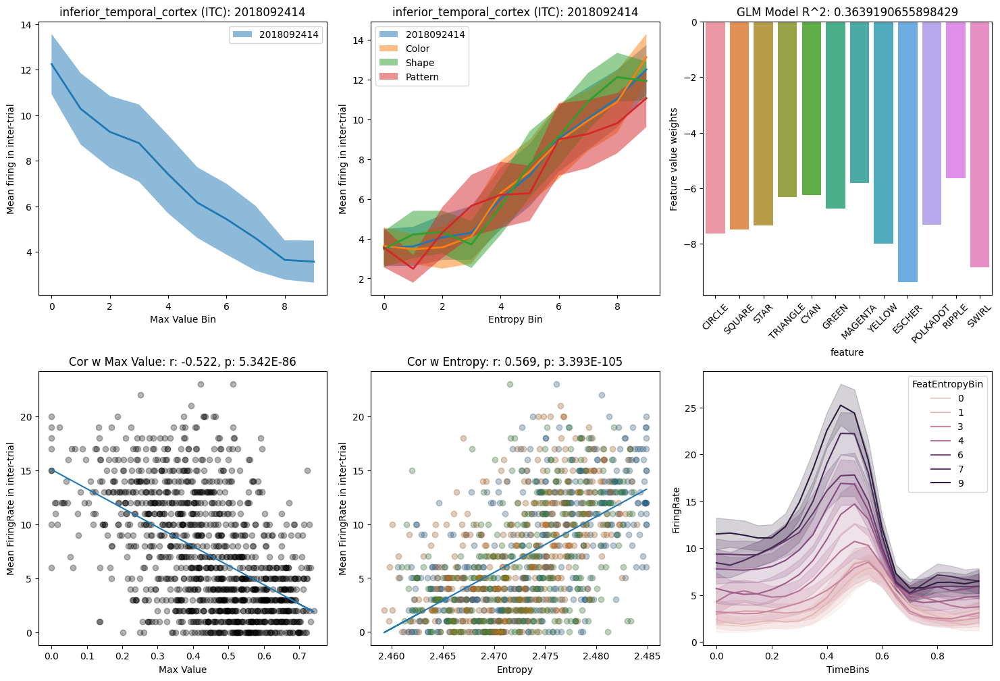

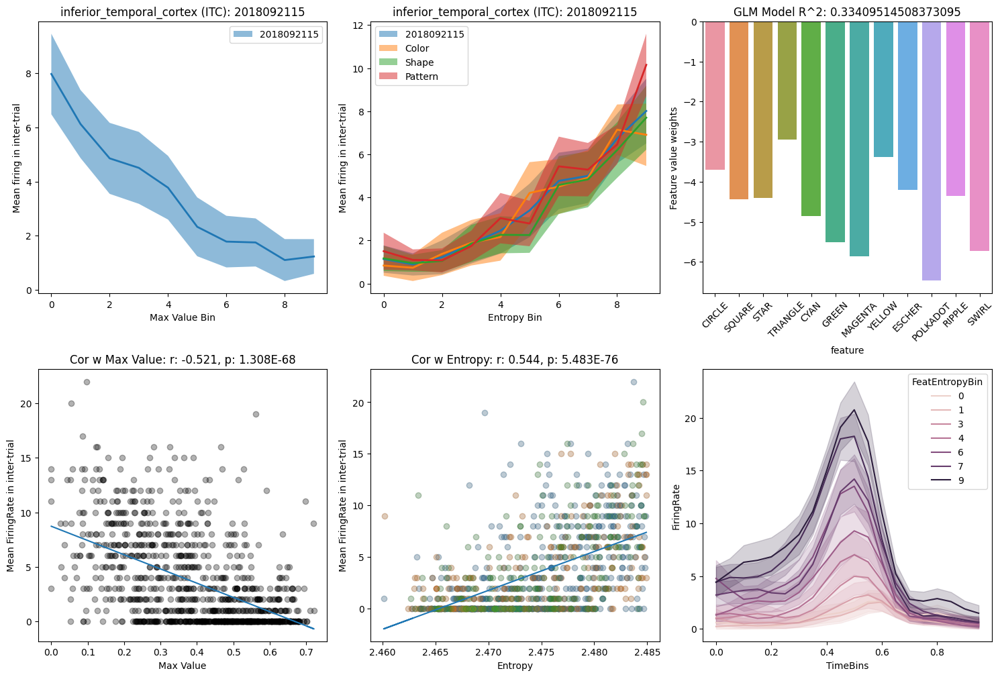

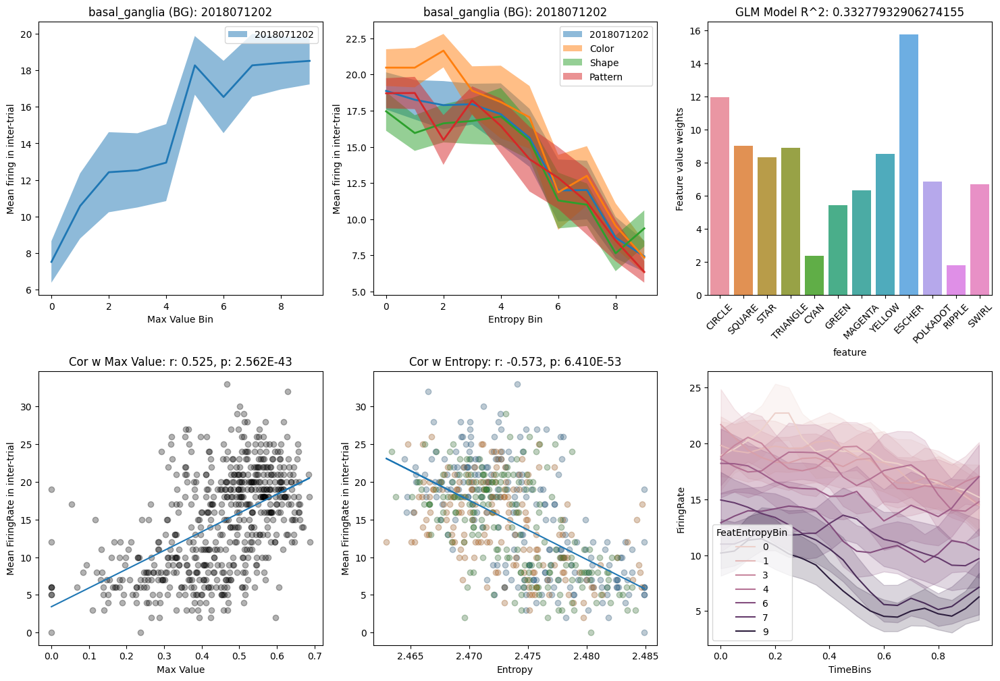

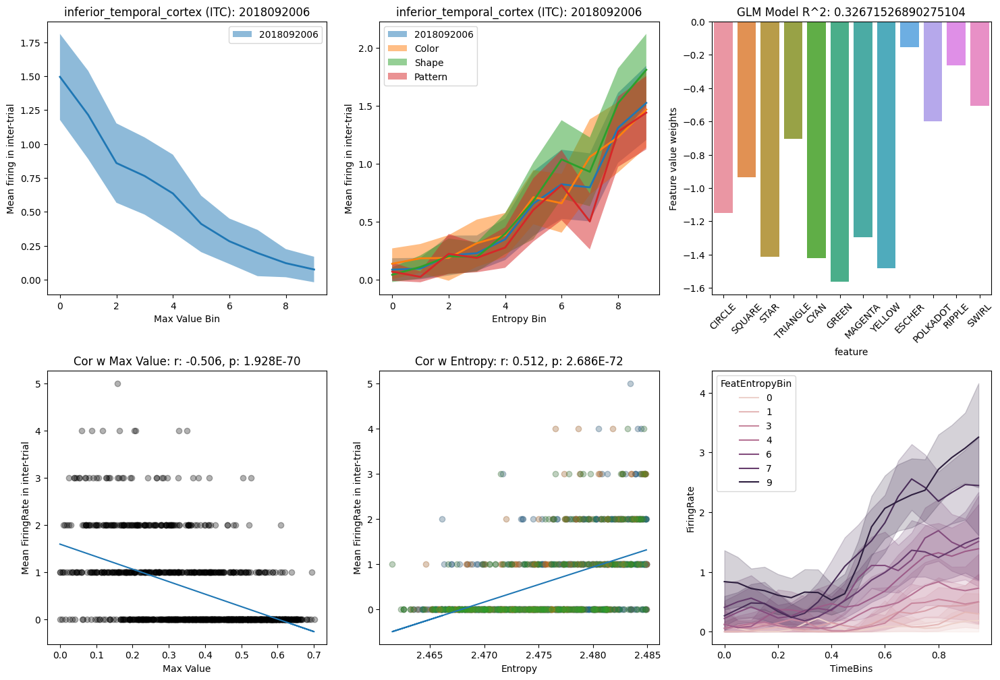

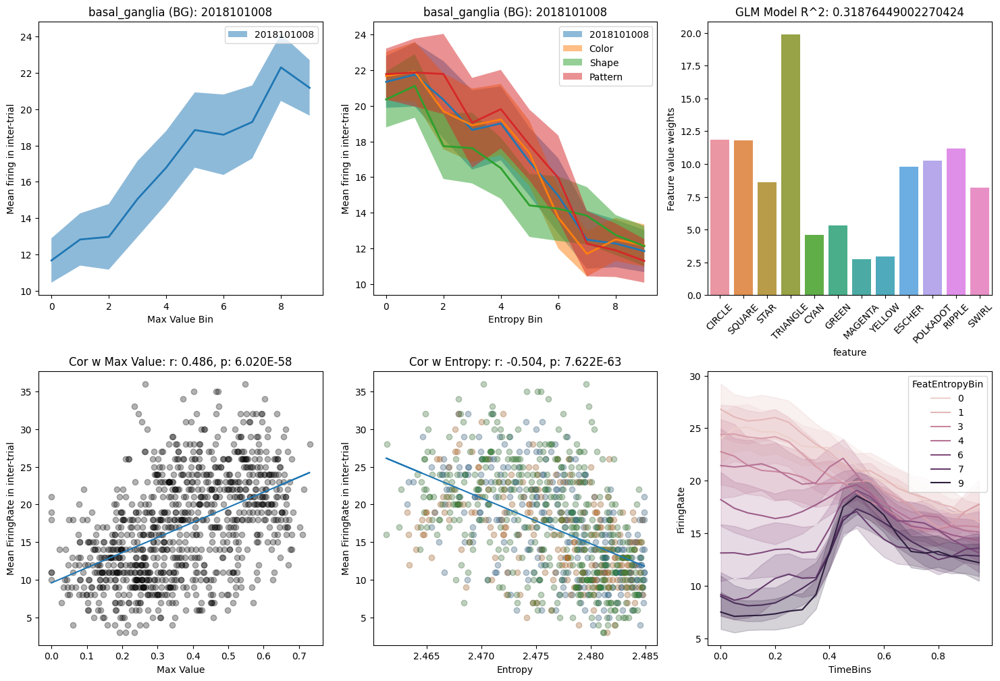

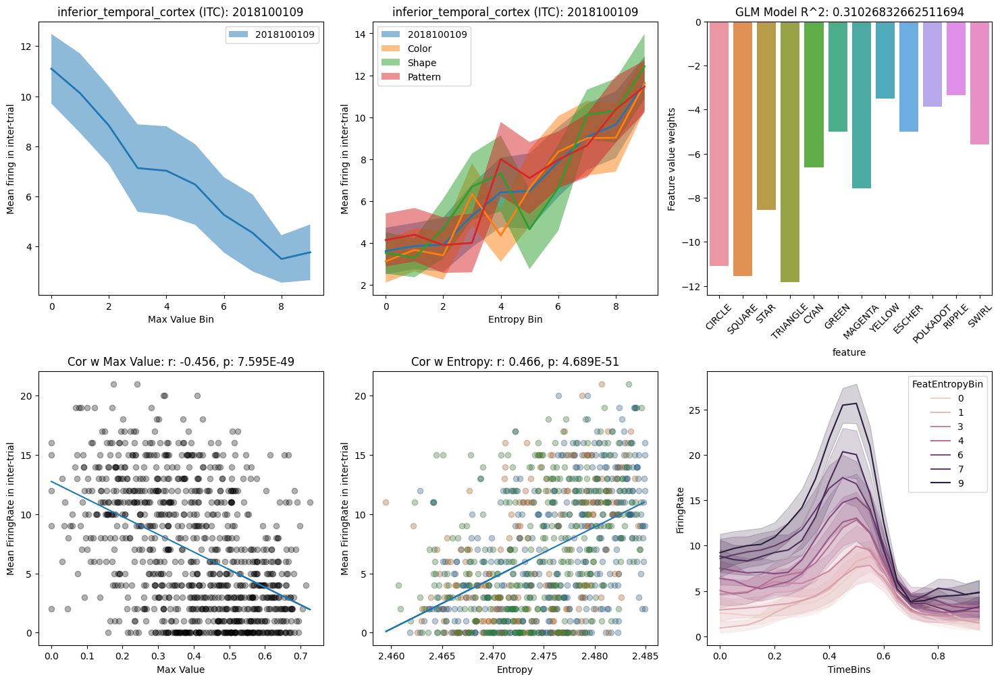

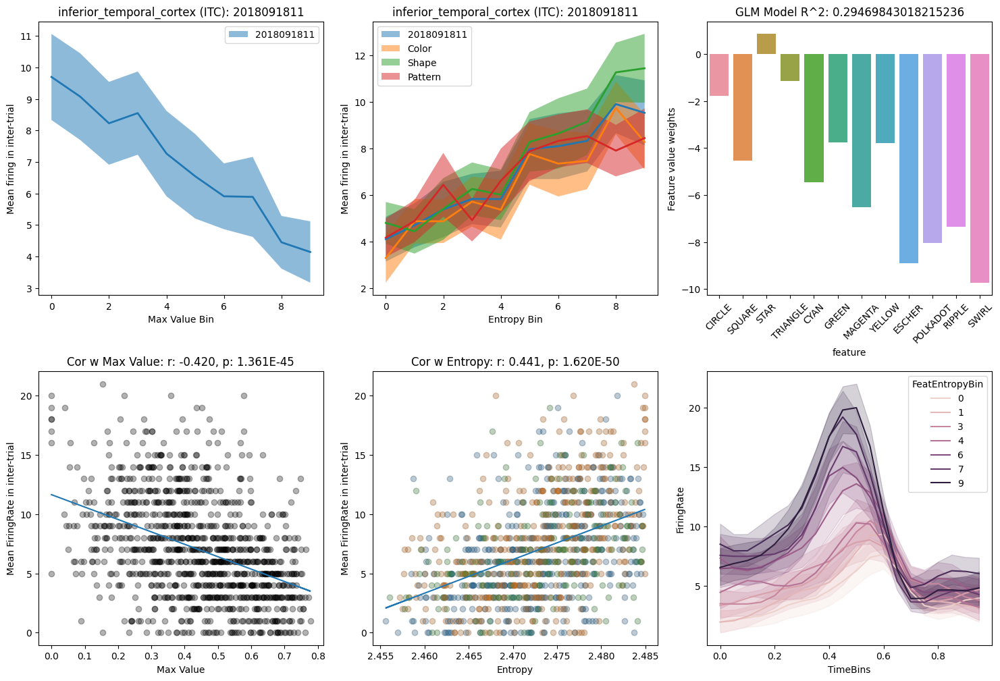

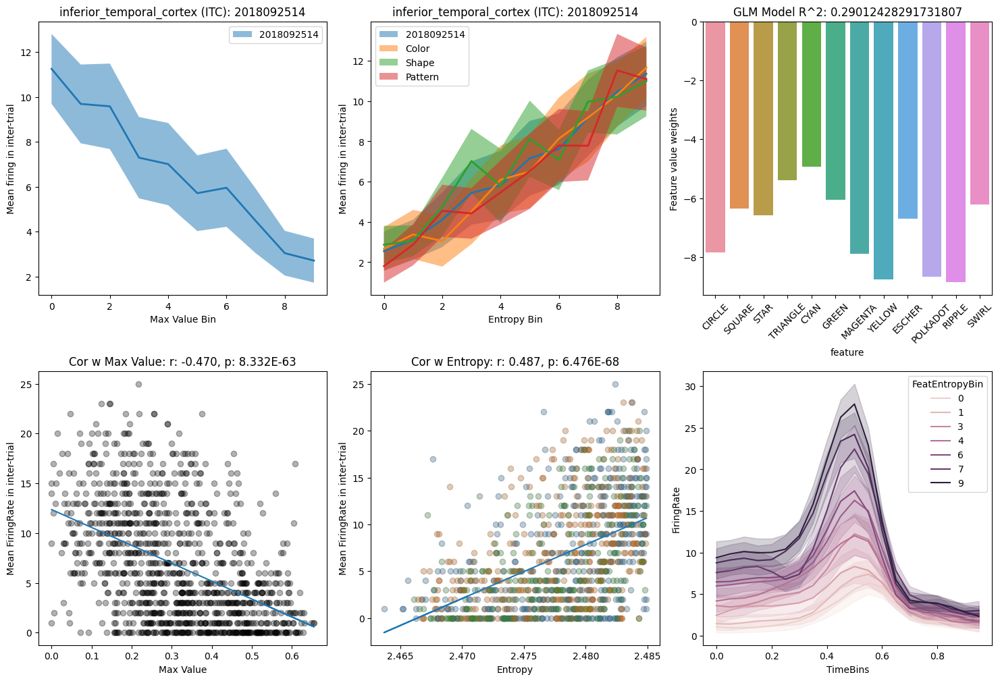

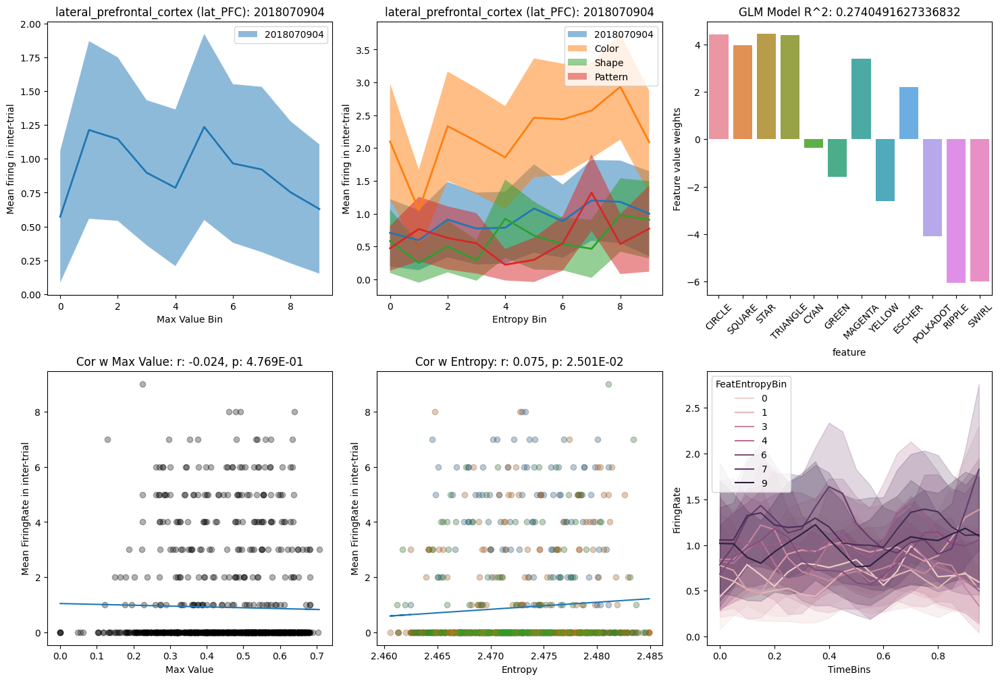

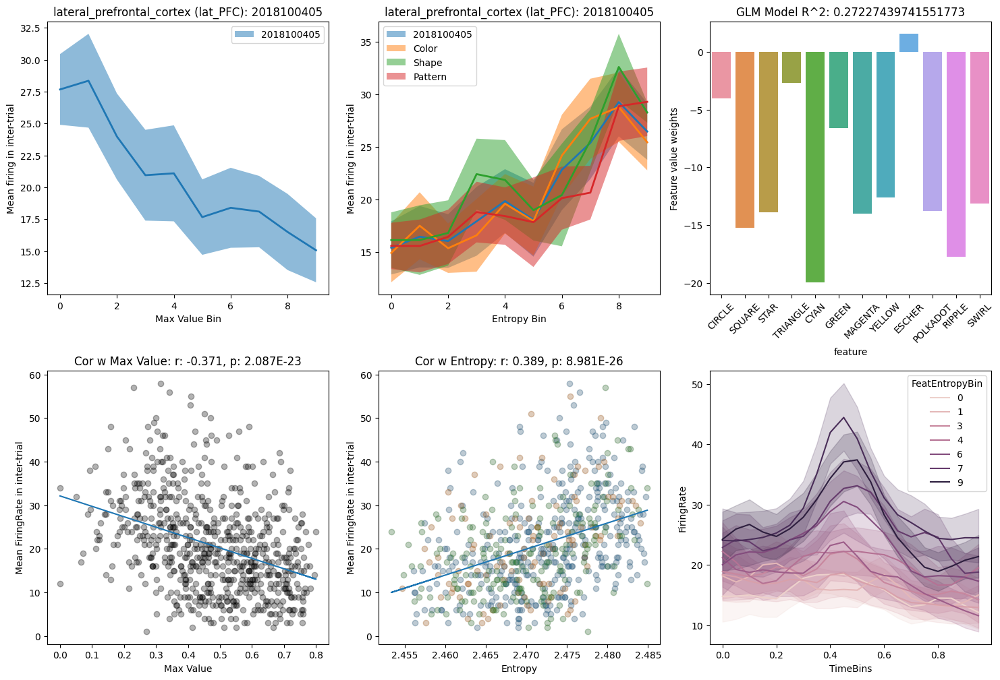

In [13]:
top = merged.sort_values(by="score", ascending=False)[:10]
# top_20 = merged[(merged.session == "20180712") & (merged.score > 0.1)]
# top_20 = merged[(merged.structure_level2 == "inferior_temporal_cortex (ITC)") & ()]
for i, row in top.iterrows():
    visualize_correlations(row, by_dims=True)

### Interesting ones

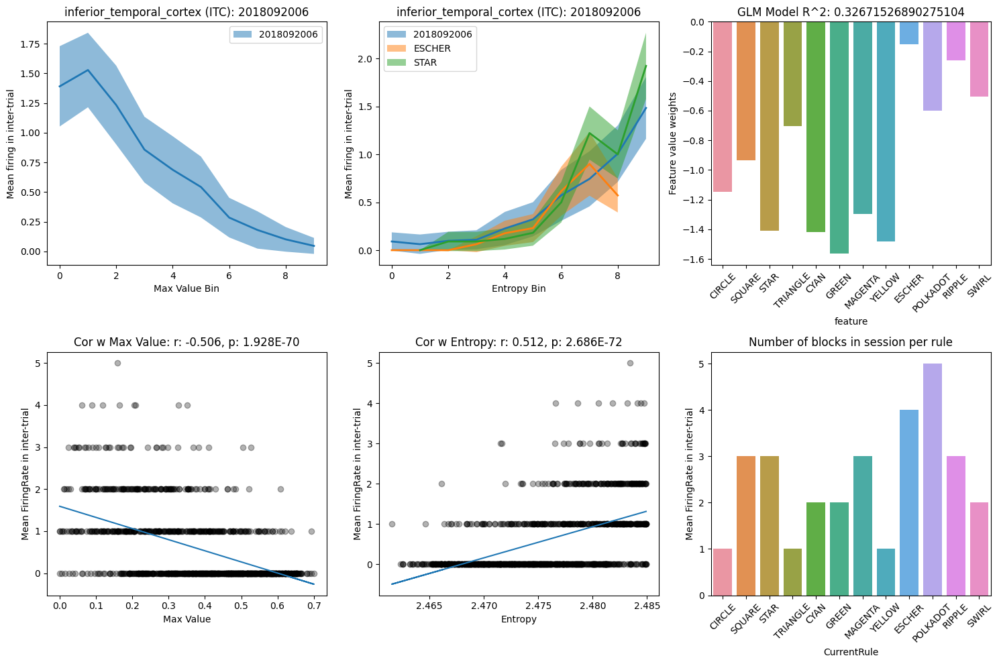

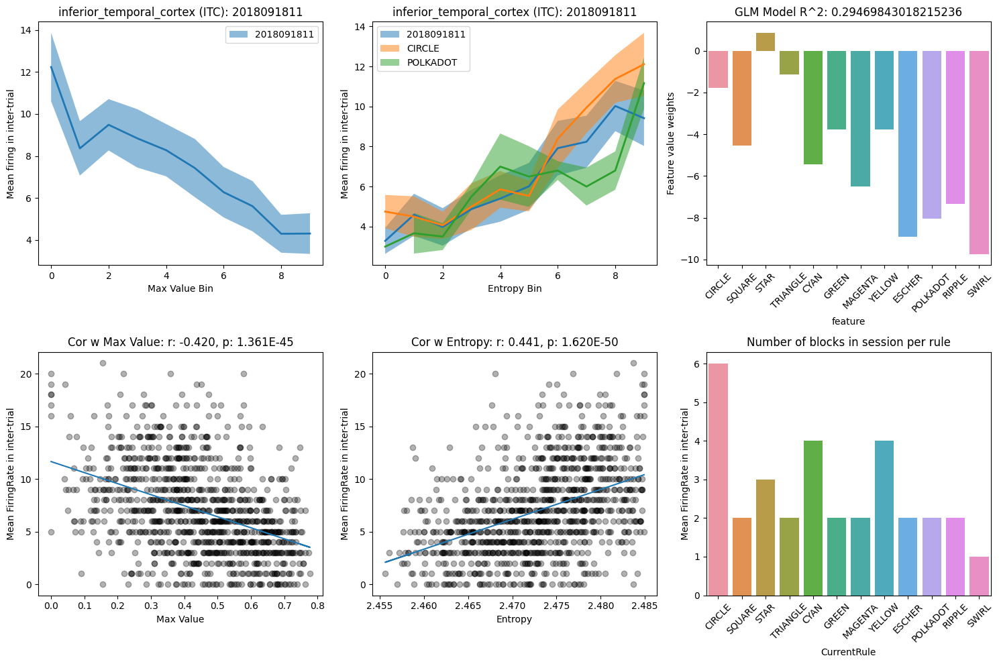

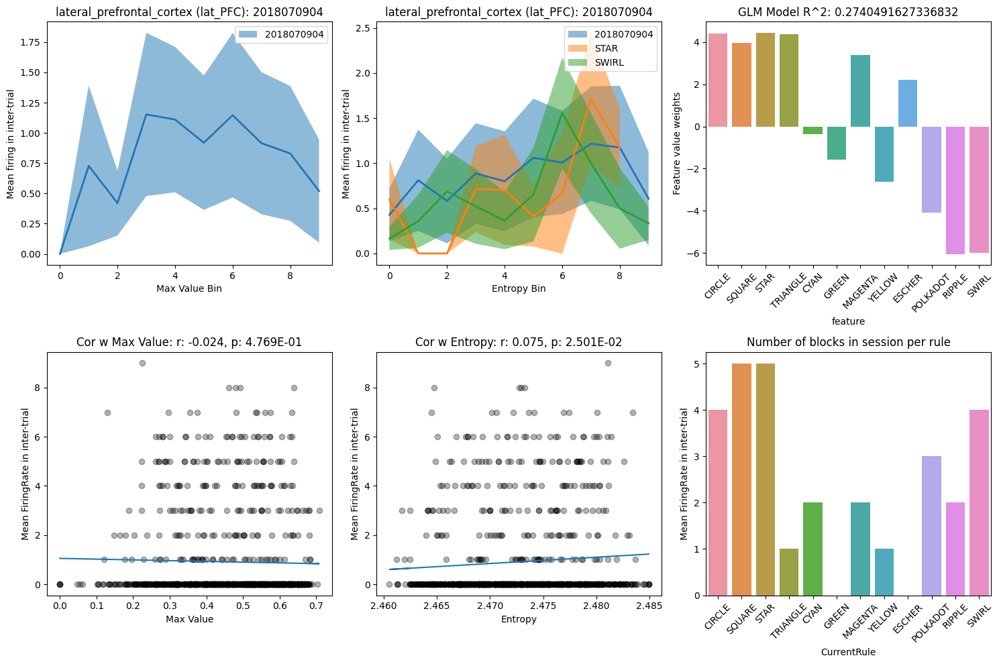

In [17]:
units = [2018092006, 2018091811, 2018070904]
interesting_feats = [["ESCHER", "STAR"], ["CIRCLE", "POLKADOT"], ["STAR", "SWIRL"]]
for i, unit in enumerate(units):
    row = merged[merged.PseudoUnitID == unit].iloc[0]
    interesting_feat = interesting_feats[i]
    visualize_correlations(row, interesting_feat)

### Lateral PFC

In [ ]:
top_lpfc = merged[merged.structure_level2 == "lateral_prefrontal_cortex (lat_PFC)"].sort_values(by="score", ascending=False)[:10]
for i, row in top_lpfc.iterrows():
    visualize_correlations(row, by_dims=True)

### HC

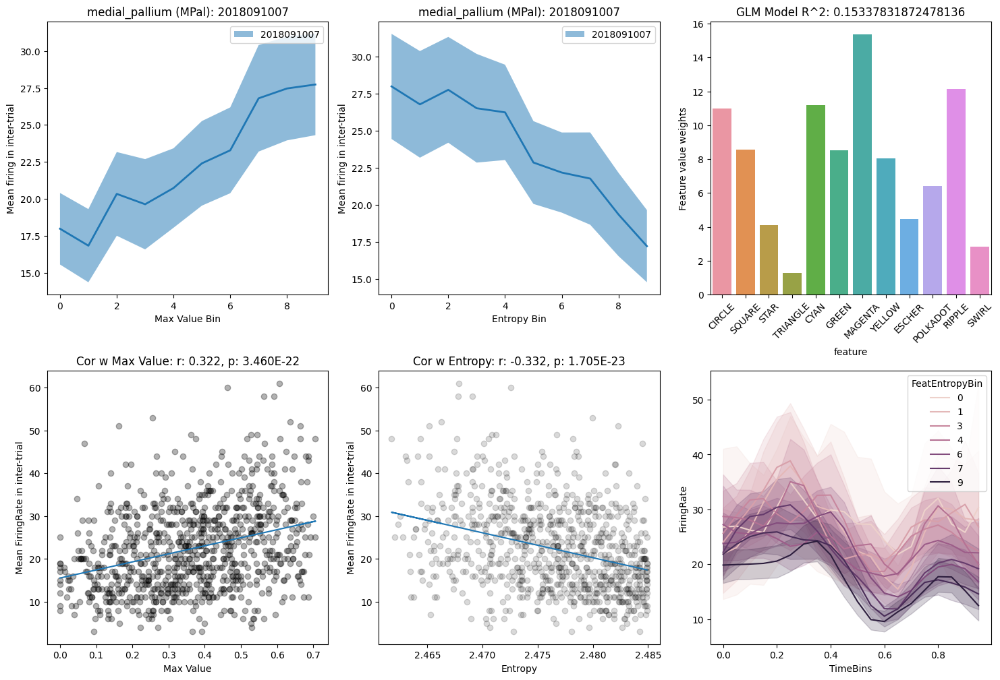

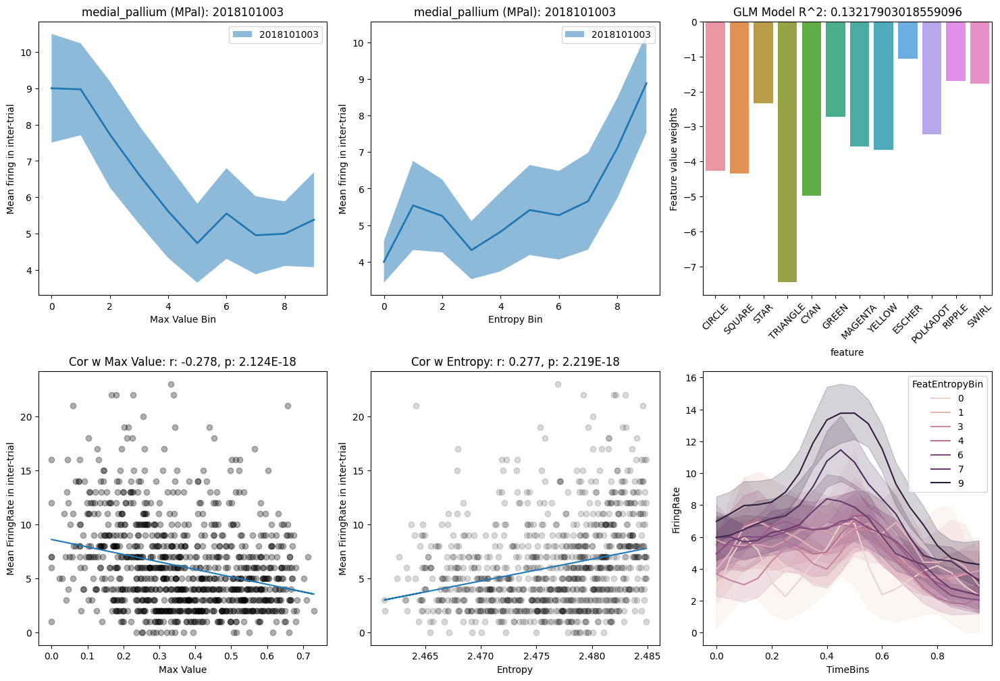

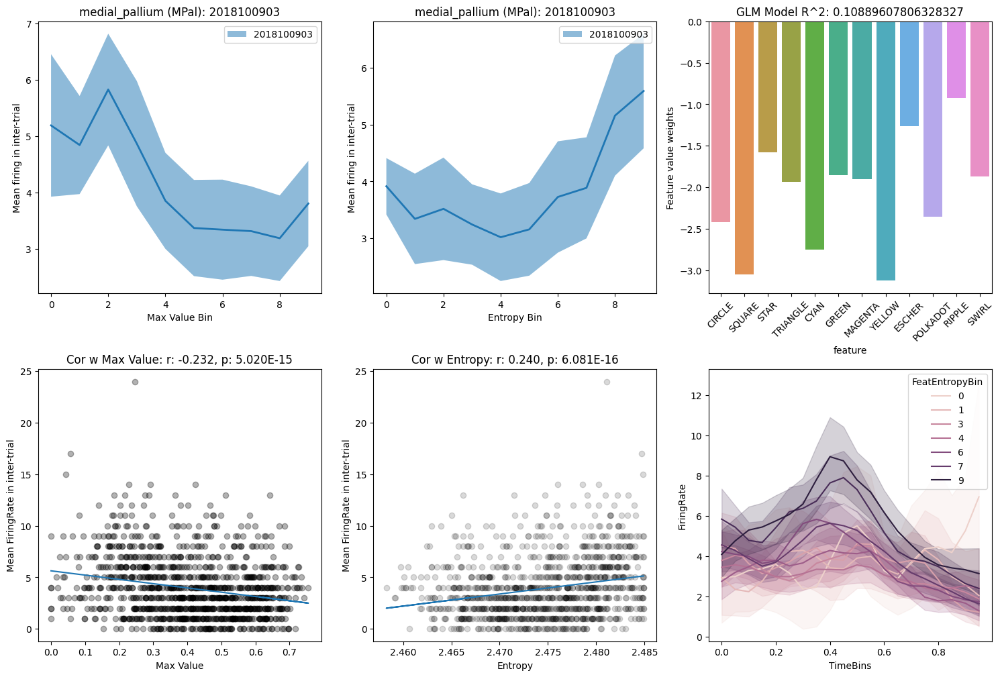

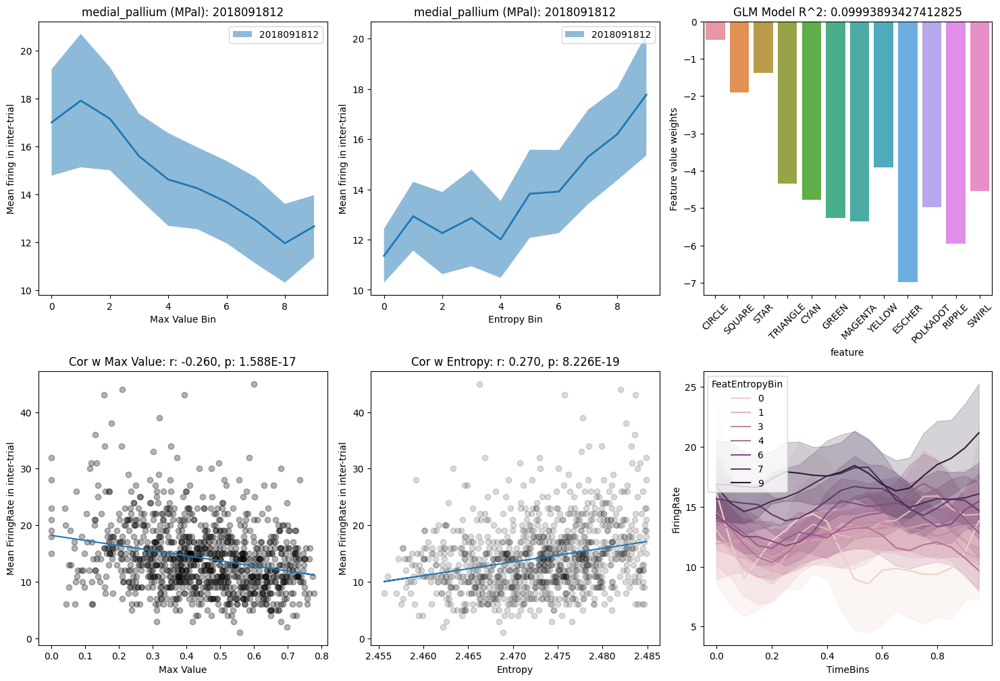

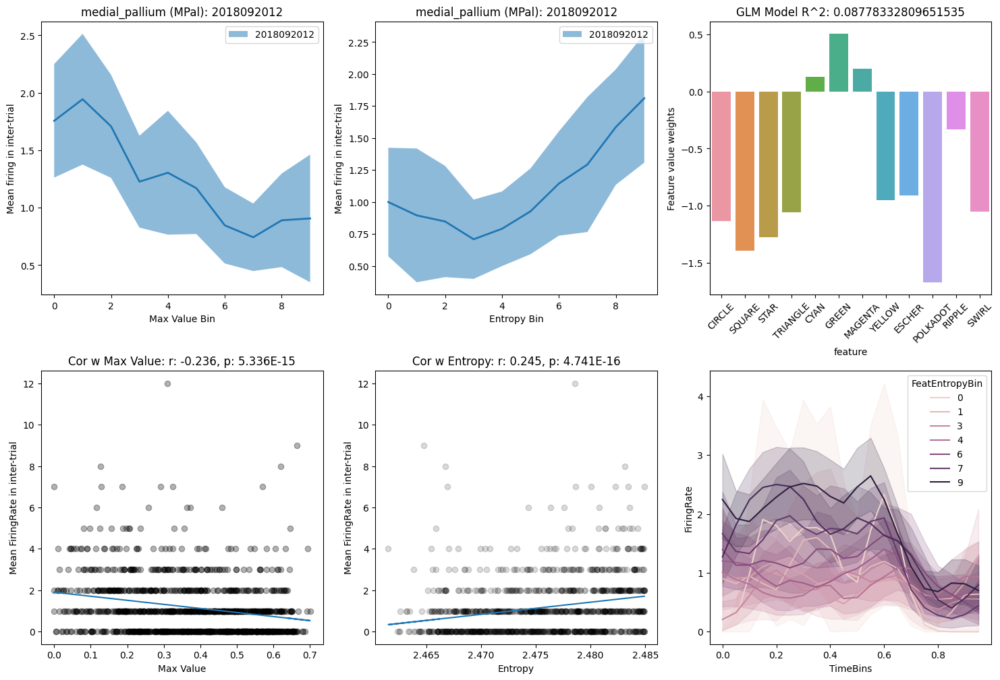

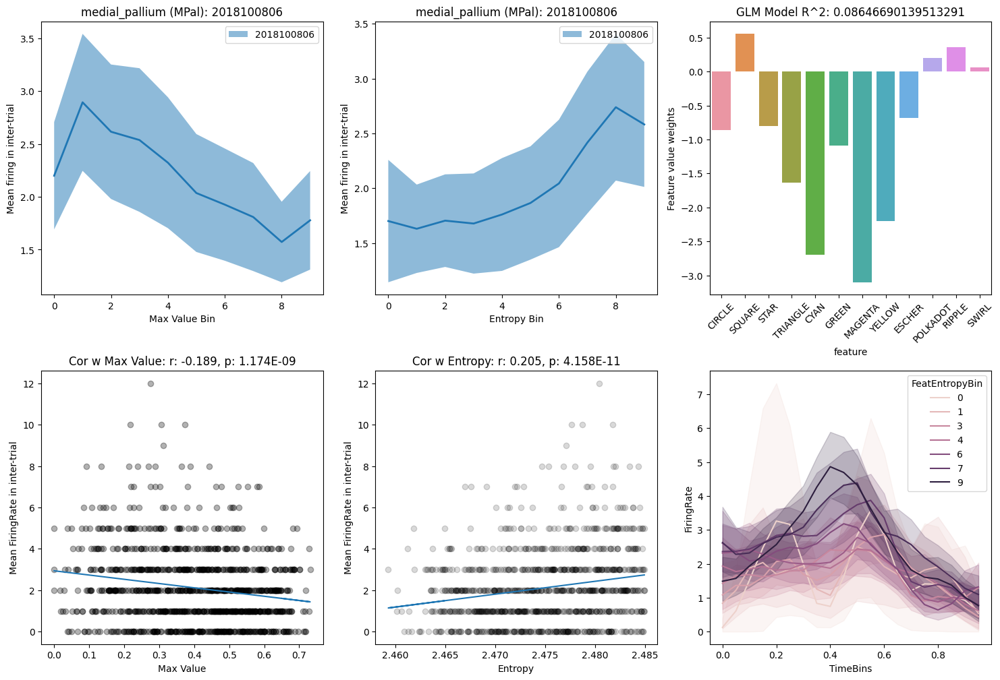

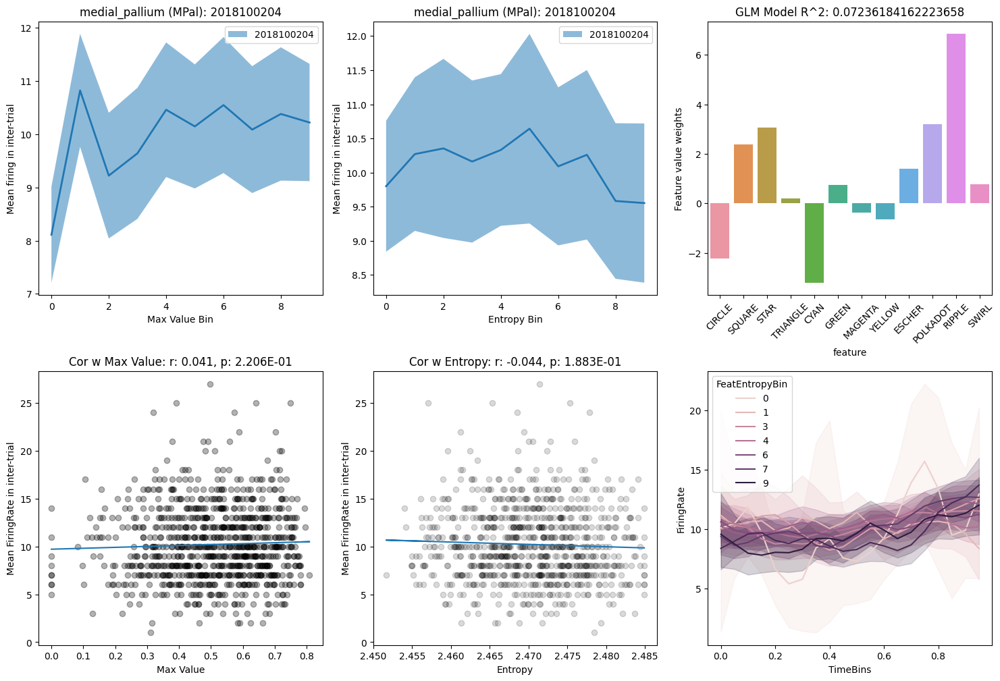

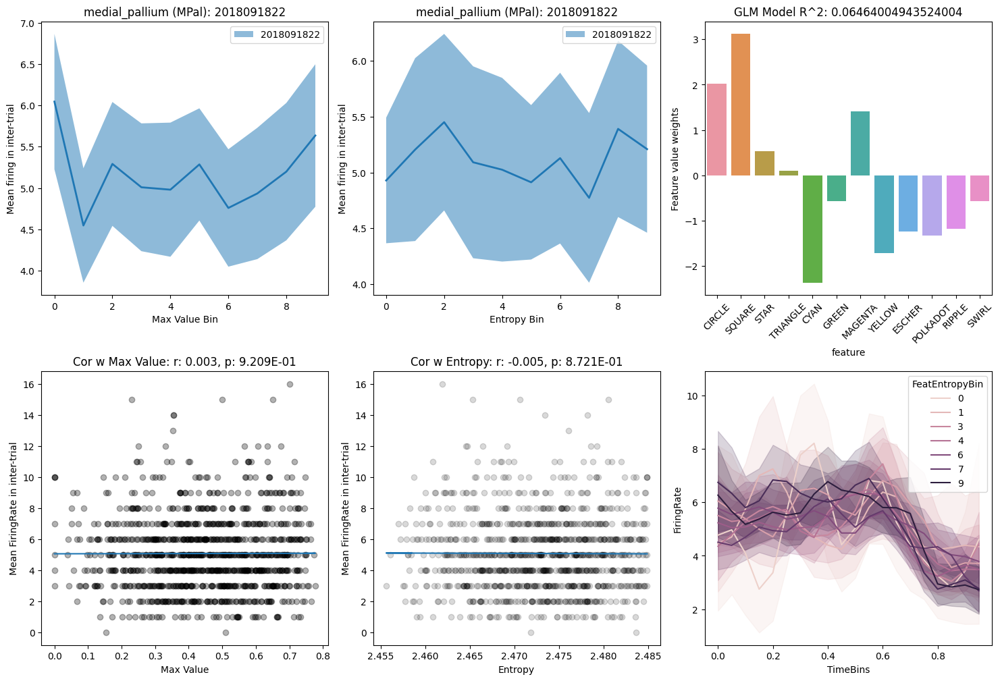

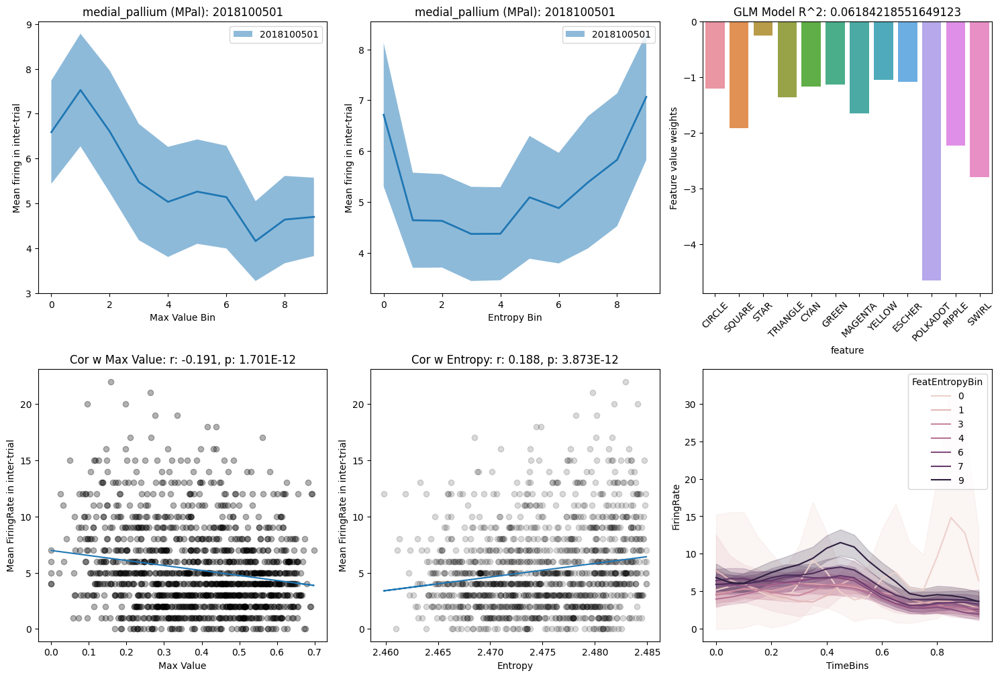

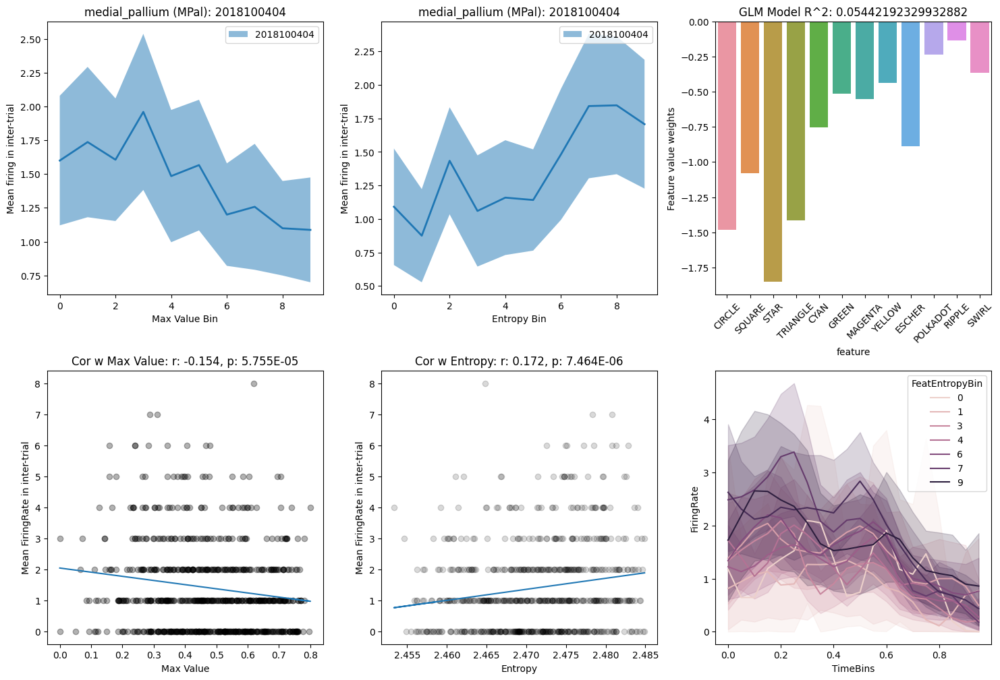

In [20]:
top_lpfc = merged[merged.structure_level3 == "hippocampal_formation (HF)"].sort_values(by="score", ascending=False)[:10]
for i, row in top_lpfc.iterrows():
    visualize_correlations(row)

### ITC

In [ ]:
top_lpfc = merged[merged.structure_level2 == "inferior_temporal_cortex (ITC)"].sort_values(by="score", ascending=False)[:20]
for i, row in top_lpfc.iterrows():
    visualize_correlations(row)

### Basal Ganglia

In [ ]:
top_lpfc = merged[merged.structure_level2 == "basal_ganglia (BG)"].sort_values(by="score", ascending=False)[:10]
for i, row in top_lpfc.iterrows():
    visualize_correlations(row)

### OFC

In [ ]:
top_lpfc = merged[merged.structure_level2 == "orbital_frontal_cortex (OFC)"].sort_values(by="score", ascending=False)[:10]
for i, row in top_lpfc.iterrows():
    visualize_correlations(row)

### Scratch testing

In [ ]:
session = 20180712
behavior_path = SESS_BEHAVIOR_PATH.format(sess_name=session)
beh = pd.read_csv(behavior_path)

# filter trials 
valid_beh = behavioral_utils.get_valid_trials(beh)
feature_selections = behavioral_utils.get_selection_features(valid_beh)
valid_beh = pd.merge(valid_beh, feature_selections, on="TrialNumber", how="inner")
beh = behavioral_utils.get_feature_values_per_session(session, valid_beh)
beh = behavioral_utils.get_relative_block_position(beh, num_bins)
beh = behavioral_utils.get_max_feature_value(beh, num_bins)
fr_path = f"/data/patrick_res/firing_rates/{session}_firing_rates_{PRE_INTERVAL}_{EVENT}_{POST_INTERVAL}_{INTERVAL_SIZE}_bins_{SMOOTH}_smooth.pickle"

frs = pd.read_pickle(fr_path)
frs = frs[frs.UnitID == row.UnitID]
agg = frs.groupby(["UnitID", "TrialNumber"]).mean().reset_index()
merged = pd.merge(agg, beh, on="TrialNumber")

In [ ]:
beh

In [ ]:
len(agg.TrialNumber.unique())